# Lab 7: Extracting and Analyzing Document Data With Multimodal LLMs

In [10]:
import os
import json
import base64
import pandas as pd
from openai import OpenAI
from IPython.display import display, Markdown, Image as IPImage

# === OpenAI Client Setup ===
client = OpenAI()

Throughout this unit, you have explored how large language models work, their limitations, and how to build applications that use them. You have practiced making API calls, managing conversation history, engineering prompts, working with multimodal inputs, and extracting structured data from images. In this lab, you will apply several of those skills together to build a document extraction and analysis pipeline using a multimodal LLM.

You will complete the following tasks:

1. Load and inspect the sample documents:
    * Load a set of expense document images and convert them to base64 format for API use
    * Visually inspect the documents to understand their structure and variability
2. Design an extraction prompt and extract structured data from each document:
    * Write your own extraction prompt specifying the fields to extract and the expected output format
    * Test the prompt on a single document and evaluate the output against the source image
3. Parse the extracted data and organize it into a DataFrame:
    * Process all documents through the extraction pipeline
    * Build a summary DataFrame from the parsed JSON results
4. Validate extractions using a second LLM call:
    * Apply the self-reflection pattern to check the model's own extraction work
    * Evaluate whether the validation step catches real errors
5. Analyze spending patterns using the LLM:
    * Write system and user prompts for financial analysis
    * Compare the LLM's analysis to the data in your DataFrame
6. Reflection and analysis:
    * Evaluate the pipeline's accuracy, limitations, and business implications

<div style="border:1px solid #ccc; border-radius:8px; padding:12px; background-color:#f8f9fa;">

<p><strong>Important:</strong> All graded cells that require you to enter code will contain regions marked with <code># YOUR CODE HERE</code> and <code># END OF YOUR CODE</code>. Between these lines, you’ll find the line <code>raise NotImplementedError("Your code is missing.")</code>, like so:</p>

```python
# YOUR CODE HERE
raise NotImplementedError("Your code is missing.")
# END OF YOUR CODE
```
<p></p>
<p>These markers indicate exactly where you should enter your answer. Replace the line <code>raise NotImplementedError("Your code is missing.")</code> with your code.

## Business Context

Read through the scenario below. You will be putting yourself in the shoes of a junior ML engineer (MLE) at SpendLens, a company tasked with building an automated document extraction pipeline for one of its clients.

#### 1. Company and Context

SpendLens is a fintech startup based in Austin that builds automation tools for business expense management. Its products help companies digitize, categorize, and analyze their vendor spending by replacing manual data entry with AI-powered extraction.

#### 2. Business Challenge

SpendLens's new client is a mid-size property management company that oversees 40 rental properties across central Texas. The company's operations team collects expense documents from vendors, contractors, and service providers, including invoices for maintenance work, receipts for supply purchases, and statements from software subscriptions. Today, a staff member opens each document, reads through it, and manually types the relevant information (vendor name, date, line items, totals) into a spreadsheet. This process is slow, error-prone, and increasingly difficult to maintain as the portfolio grows.

#### 3. Business Goal

SpendLens's goal is to build a prototype pipeline that can accept expense document images, extract structured data from each one, and produce a spending summary across the batch. If successful, the pipeline would allow the client's operations team to process documents in minutes rather than hours and reduce data entry errors.

#### 4. Your Role and Task

You have just joined SpendLens as a junior MLE on the Document Intelligence team. The team has been given a set of four sample expense documents from the client and asked to build and test a prototype extraction pipeline. Your job is to design the extraction logic, validate the outputs, and analyze the results.

This work requires judgment at every stage. The extraction prompt you write determines what the model looks for and how it structures the output. The validation logic you design determines whether errors get caught before the data enters a downstream system. The decisions you make about how to handle ambiguous or missing information will directly affect the quality of the client's spending reports.

#### 5. Technical Focus in This Lab

This lab focuses on building a multimodal LLM pipeline:

* **Multimodal API Calls** &mdash; Sending images and text together to a vision-capable model to extract information from documents.
* **Structured Output** &mdash; Using JSON response formatting to ensure the model returns data in a consistent, parseable structure.
* **Prompt Engineering for Extraction** &mdash; Writing prompts that specify fields, formats, and edge case handling for structured data tasks.
* **LLM-Based Validation** &mdash; Applying the self-reflection pattern to have the model check its own work against the source document.
* **LLM-Assisted Analysis** &mdash; Using the model to summarize and analyze the extracted data.

## Part 1. Load and Inspect the Documents

SpendLens has provided you with four sample expense documents. These are stored as image files in the `data/receipts/` directory. Before you send anything to an LLM, you should look at the documents yourself to understand what you are working with.

The helper function below converts an image file to base64 format, which is required for sending images to the OpenAI API. You used this same pattern in the Extract Data project.

In [11]:
# Do not remove or edit this cell

def image_to_base64(file_path: str) -> str:
    """
    Reads an image file and returns its base64 encoded string.
    """
    with open(file_path, "rb") as f:
        return base64.b64encode(f.read()).decode("utf-8")

# Path to the directory containing the receipt images
receipts_folder = os.path.join(os.getcwd(), "data", "receipts")

**Task**: Use `os.listdir()` to list all files in the `receipts_folder` directory. Save the result to a variable called `image_files`. Then sort the list so the files are in a consistent order.

In [12]:
# YOUR CODE HERE
image_files = sorted(os.listdir(receipts_folder))
# END OF YOUR CODE

**Task**: Display the number of documents in your dataset.

In [13]:
# YOUR CODE HERE
print(f"Number of documents in dataset: {len(image_files)}")
# END OF YOUR CODE

Number of documents in dataset: 4


Now let's display all of the images so you can see what the documents look like. Take a moment to look at each one and note the differences in format, layout, and legibility.


--- receipt_01.png ---


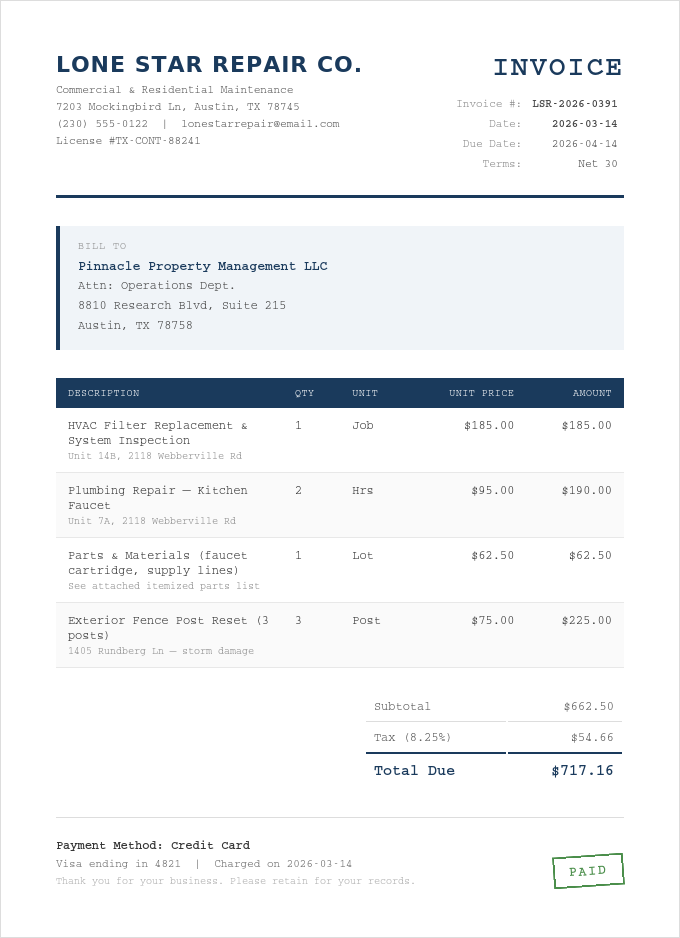


--- receipt_02.png ---


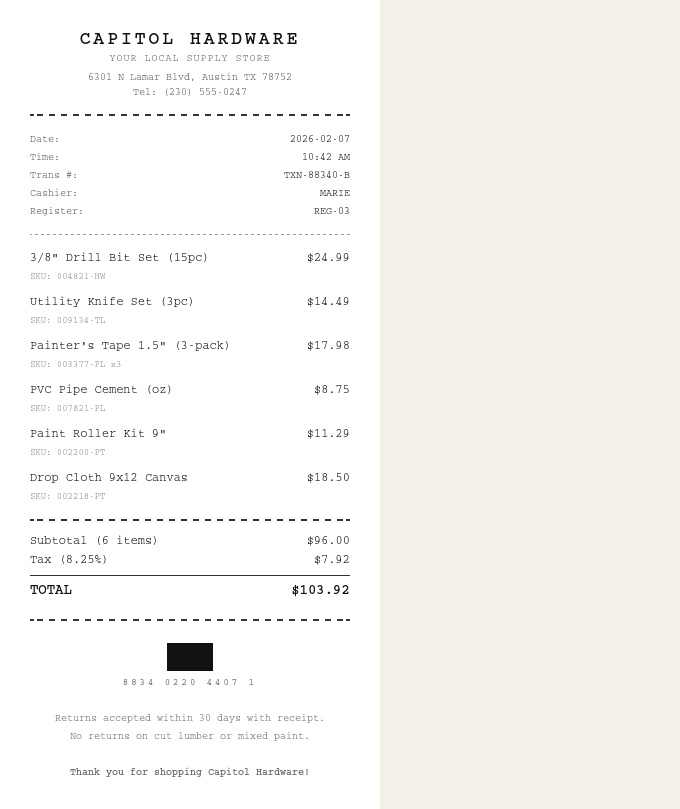


--- receipt_03.png ---


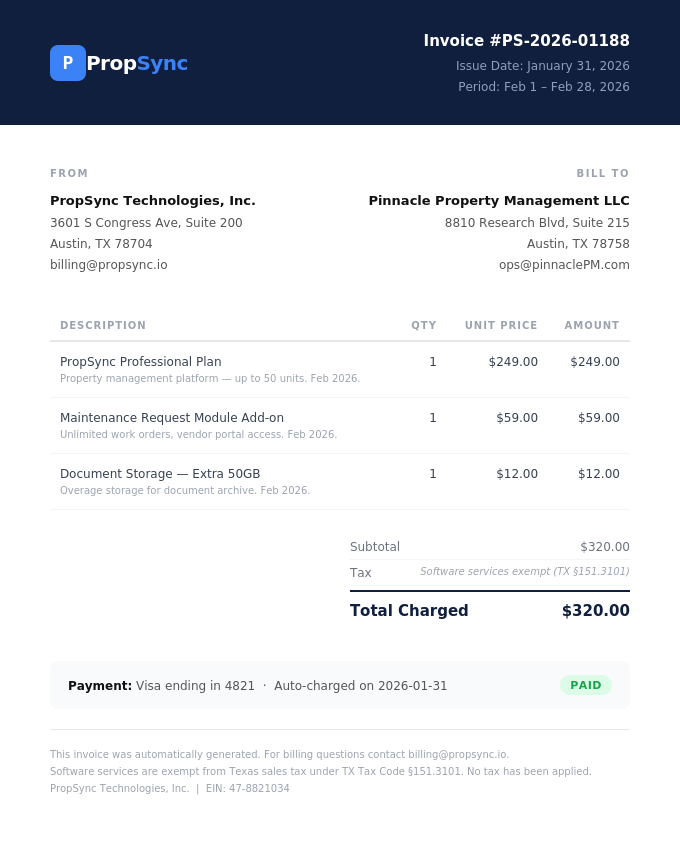


--- receipt_04.png ---


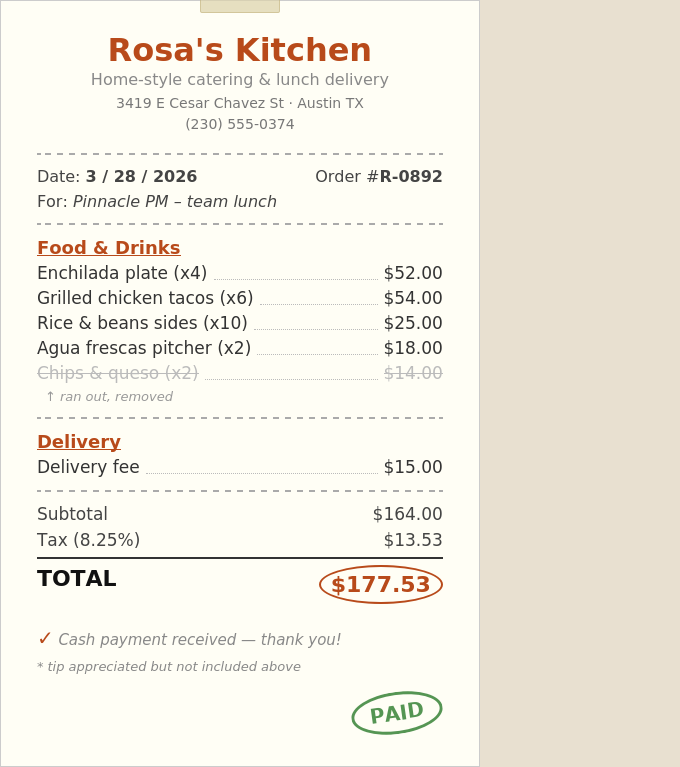

In [14]:
# Do not remove or edit this cell
for filename in image_files:
    file_path = os.path.join(receipts_folder, filename)
    print(f"\n--- {filename} ---")
    display(IPImage(filename=file_path, width=400))

**Task**: Convert all images to base64 and store them in a dictionary where the keys are filenames and the values are base64 strings. Save the result to a variable called `image_data`.

*Tip*: Loop through `image_files`, build the full file path using `os.path.join()`, and call the `image_to_base64()` function for each file.

In [15]:
# YOUR CODE HERE
image_data = {}
for filename in image_files:
    file_path = os.path.join(receipts_folder, filename)
    image_data[filename] = image_to_base64(file_path)
# END OF YOUR CODE

## Part 2. Design Your Extraction Prompt

In the Extract Data project, the extraction prompt was provided to you. Now it is your turn to write one.

SpendLens needs the following fields extracted from each document:

- `vendor_name`: The name of the business or vendor
- `transaction_date`: The date of the transaction (use YYYY-MM-DD format)
- `items`: A list of items or services. Each item should include a `description` and a `price`.
- `tax_amount`: The tax charged, if visible
- `total_amount`: The final total
- `payment_method`: How the bill was paid (e.g., "Credit Card", "Cash"), if visible
- `spending_category`: Classify the expense into one of these categories: "Office Supplies", "Food & Dining", "Software & Technology", "Travel", "Professional Services", or "Other"

Your prompt should also instruct the model on what to do when a field is not present in the document (use `null`).

**Task**: Create a variable called `extraction_prompt` and assign it a prompt that instructs the model to extract the fields listed above from a document image. Your prompt should specify the expected output format (JSON), list every field with a description, and explain how to handle missing values.

*Tip*: Use triple quotation marks (`"""`) to write a multi-line string.

In [16]:
# YOUR CODE HERE
extraction_prompt = """
You are an expert document processing AI. Analyze the provided document image and extract the following information into a structured JSON object.

Extract these exact fields:
- vendor_name (string): The name of the business or vendor.
- transaction_date (string): The date of the transaction formatted as YYYY-MM-DD.
- items (list of objects): A list of items or services purchased. Each item must contain:
    - description (string): Description of the item.
    - price (number): Price of the item.
- tax_amount (number or null): The tax charged, if visible.
- total_amount (number): The final total amount paid.
- payment_method (string or null): How the bill was paid (e.g., "Credit Card", "Cash"), if visible.
- spending_category (string): Classify the expense into exactly one of these categories:
  "Office Supplies", "Food & Dining", "Software & Technology", "Travel", "Professional Services", or "Other".

Guidelines:
- If a field is missing, unclear, or not present in the document, set its value to null.
- Ensure all numeric values (prices, totals, tax) are represented as standard numbers/floats without currency symbols (e.g., 12.99 instead of "$12.99").
- Return ONLY valid JSON with no extra commentary or markdown formatting outside the JSON block.
"""
# END OF YOUR CODE

Before processing all four documents, let's test your prompt on a single image to make sure it works. The cell below sends the first document to the API using your extraction prompt.

In [17]:
# Do not remove or edit this cell

# Get the first image
first_filename = image_files[0]
first_image_b64 = image_data[first_filename]

# Make the API call
test_response = client.chat.completions.create(
    model="gpt-4o",
    messages=[ 
        {
            "role": "user",
            "content": [
                {"type": "text", "text": extraction_prompt},
                {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{first_image_b64}"}}
            ]
        }
    ],
    response_format={"type": "json_object"},
    max_tokens=1000
)

# Display the result
test_result = test_response.choices[0].message.content
print(f"Extraction result for {first_filename}:")
print("=" * 60)
print(test_result)

Extraction result for receipt_01.png:
{
  "vendor_name": "Lone Star Repair Co.",
  "transaction_date": "2026-03-14",
  "items": [
    {
      "description": "HVAC Filter Replacement & System Inspection",
      "price": 185.00
    },
    {
      "description": "Plumbing Repair — Kitchen Faucet",
      "price": 190.00
    },
    {
      "description": "Parts & Materials (faucet cartridge, supply lines)",
      "price": 62.50
    },
    {
      "description": "Exterior Pence Post Reset (3 posts)",
      "price": 225.00
    }
  ],
  "tax_amount": 54.66,
  "total_amount": 717.16,
  "payment_method": "Credit Card",
  "spending_category": "Professional Services"
}


**Task**: Look at the output above and compare it to the original image. In the markdown cell below, answer the following:

1. Did the model extract all of the fields you specified?
2. Are the extracted values accurate based on what you see in the image?
3. Is there anything you would change about your prompt based on this test?

1. **Field Extraction:** Yes, the model successfully extracted all requested fields (`vendor_name`, `transaction_date`, `items`, `tax_amount`, `total_amount`, `payment_method`, and `spending_category`).
2. **Accuracy:** The values are mostly accurate and strictly follow the requested formats (e.g., date as `YYYY-MM-DD`, items broken down with descriptions and prices). However, there is a minor OCR/extraction typo in the last item description where **"Fence"** was extracted as **"Pence"** ("Exterior Pence Post Reset").
3.  **Prompt Improvements:** To prevent OCR spelling mistakes, I would add a instruction to the prompt asking the model to perform a spell-check or context-aware correction on extracted text (e.g., *"Ensure extracted item descriptions use standard English spelling where OCR errors or misreads might occur"*).
    Additionally, I could explicitly remind the model to verify that line items plus tax sum correctly to the extracted `total_amount` ($185.00 + $190.00 + $62.50 + $225.00 + $54.66 = \$717.16$).

## Part 3. Extract Data From All Documents

Now that you have tested your prompt, it is time to process all four documents. You will loop through each image, send it to the API, and collect the results.

**Task**: Write a loop that iterates through every item in `image_data` (the dictionary you created in Part 1). For each image, make an API call using your `extraction_prompt`, extract the response text, and store it in the dictionary `raw_results` with the filename as the key. Print each result as it comes back so you can monitor progress.

*Tip*: Use the same API call structure shown in the test cell above. The dictionary `image_data` has filenames as keys and base64 strings as values. You can loop through it using `image_data.items()`.

In [19]:
# Do not remove or edit the line below:
raw_results = {}

# YOUR CODE HERE
for filename, base64_image in image_data.items():
    print(f"Processing {filename}...")
    
    response = client.chat.completions.create(
        model="gpt-4o",
        messages=[ 
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": extraction_prompt},
                    {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{base64_image}"}}
                ]
            }
        ],
        response_format={"type": "json_object"},
        max_tokens=1000
    )
    
    result_text = response.choices[0].message.content
    raw_results[filename] = result_text
    
    print(f"\n--- {filename} ---")
    print(result_text)
    print("=" * 60)
# END OF YOUR CODE

Processing receipt_01.png...

--- receipt_01.png ---
{
  "vendor_name": "Lone Star Repair Co.",
  "transaction_date": "2026-03-14",
  "items": [
    {
      "description": "HVAC Filter Replacement & System Inspection",
      "price": 185.00
    },
    {
      "description": "Plumbing Repair – Kitchen Faucet",
      "price": 190.00
    },
    {
      "description": "Parts & Materials (faucet cartridge, supply lines)",
      "price": 62.50
    },
    {
      "description": "Exterior Fence Post Reset (3 posts)",
      "price": 225.00
    }
  ],
  "tax_amount": 54.66,
  "total_amount": 717.16,
  "payment_method": "Credit Card",
  "spending_category": "Professional Services"
}
Processing receipt_02.png...

--- receipt_02.png ---
{
    "vendor_name": "Capitol Hardware",
    "transaction_date": "2026-02-07",
    "items": [
        {
            "description": "3/8\" Drill Bit Set (15pc)",
            "price": 24.99
        },
        {
            "description": "Utility Knife Set (3pc)",
   

#### Parse the JSON Results

The API returns JSON as a string. The code below parses each string into a Python dictionary so you can work with the data programmatically.

In [20]:
# Do not remove or edit this cell

parsed_results = {}

for filename, raw_json in raw_results.items():
    try:
        parsed = json.loads(raw_json)
        parsed_results[filename] = parsed
        print(f"Successfully parsed: {filename}")
    except json.JSONDecodeError as e:
        print(f"Error parsing {filename}: {e}")
        parsed_results[filename] = {"error": str(e)}

print(f"\nParsed {len(parsed_results)} documents.")

Successfully parsed: receipt_01.png
Successfully parsed: receipt_02.png
Successfully parsed: receipt_03.png
Successfully parsed: receipt_04.png

Parsed 4 documents.


#### Build a Summary DataFrame

Now let's organize the extracted data into a pandas DataFrame. This will make it easier to review the results and spot any issues.

**Task**: Create a list called `rows` by looping through `parsed_results`. For each document, create a dictionary with the following keys: `"filename"`, `"vendor_name"`, `"transaction_date"`, `"total_amount"`, `"tax_amount"`, `"payment_method"`, `"spending_category"`, and `"num_items"` (the number of items in the `"items"` list). Append each dictionary to `rows`.

Then create a DataFrame called `df` from `rows`.

*Tip*: Use the `.get()` method to safely access dictionary keys, in case a field is missing. For example, `parsed.get("vendor_name", None)` returns `None` if the key does not exist. For `num_items`, use `len()` on the items list, but make sure to handle the case where the list might not exist.

In [21]:
# YOUR CODE HERE
rows = []
for filename, parsed in parsed_results.items():
    items = parsed.get("items")
    num_items = len(items) if isinstance(items, list) else 0
    
    rows.append({
        "filename": filename,
        "vendor_name": parsed.get("vendor_name", None),
        "transaction_date": parsed.get("transaction_date", None),
        "total_amount": parsed.get("total_amount", None),
        "tax_amount": parsed.get("tax_amount", None),
        "payment_method": parsed.get("payment_method", None),
        "spending_category": parsed.get("spending_category", None),
        "num_items": num_items
    })

df = pd.DataFrame(rows)
# END OF YOUR CODE

**Task**: Display the full DataFrame.

In [22]:
# YOUR CODE HERE
display(df)
# END OF YOUR CODE

,filename,vendor_name,transaction_date,total_amount,tax_amount,payment_method,spending_category,num_items
0,receipt_01.png,Lone Star Repair Co.,2026-03-14,717.16,54.66,Credit Card,Professional Services,4
1,receipt_02.png,Capitol Hardware,2026-02-07,103.92,7.92,None,Other,6
2,receipt_03.png,"PropSync Technologies, Inc.",2026-01-31,320.00,NaN,Credit Card,Software & Technology,3
3,receipt_04.png,Rosa's Kitchen,2026-03-28,177.53,13.53,Cash,Food & Dining,5


## Part 4. Validate Extractions

Extraction is only useful if it is accurate. In a production pipeline, you would want a quality-check step that flags potential errors before the data enters a downstream system.

You are going to use the same multimodal model to validate its own work. The idea is to send the original image *and* the extracted data back to the model and ask it to check for discrepancies. This applies the self-reflection pattern you practiced earlier in this unit, but in a data extraction context.

Specifically, the validation prompt should ask the model to check:
- Whether the total matches the sum of item prices plus tax
- Whether the vendor name and date are correct
- Whether any line items were missed or duplicated
- Whether the spending category is appropriate

**Task**: Create a variable called `validation_prompt_template` that contains a validation prompt. This prompt will be combined with the extracted data for each document using an f-string. Use the placeholder `{extracted_json}` where the extracted data should appear.

Your prompt should:
1. Explain the task (check the extracted data against the original image)
2. Include the extracted data (using the `{extracted_json}` placeholder)
3. List the specific checks to perform (the four items listed above)
4. Instruct the model to output a brief assessment: either "PASS" if everything looks correct, or a description of each issue found

*Note*: Because this template contains curly braces for the f-string placeholder `{extracted_json}`, you should define it as a regular string now and use `.format()` later, rather than using an f-string directly. For example:
```python
validation_prompt_template = "Check the following data: {extracted_json}"
```

In [23]:
# YOUR CODE HERE
validation_prompt_template = """You are a quality assurance auditor verifying extracted document data against an original receipt image.

Your task is to carefully review the extracted JSON data below against the attached document image and identify any discrepancies.

Extracted Data:
{extracted_json}

Please perform the following specific checks:
1. Math Check: Verify whether the total_amount matches the sum of individual item prices plus tax_amount.
2. Vendor & Date Check: Confirm that vendor_name and transaction_date accurately match the image text.
3. Line Items Check: Verify that no line items were missed, added extra, or duplicated.
4. Category Check: Ensure the spending_category is accurate and appropriate for the transaction.

Output Format:
- If everything is accurate and all checks pass, reply with "PASS" followed by a brief confirmation.
- If you find any discrepancies or errors, list each issue clearly under a bullet point.
"""
# END OF YOUR CODE

Now let's run the validation on each document. The cell below loops through all documents, formats the validation prompt with each document's extracted data, and sends both the prompt and the original image to the model.

In [25]:
# Do not remove or edit this cell

validation_results = {}

for filename in parsed_results:
    # Format the extracted data as a readable JSON string
    extracted_json = json.dumps(parsed_results[filename], indent=2)

    # Build the validation prompt with the extracted data inserted
    filled_prompt = validation_prompt_template.format(extracted_json=extracted_json)

    # Send the original image and the validation prompt to the model
    val_response = client.chat.completions.create(
        model="gpt-4o",
        messages=[
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": filled_prompt},
                    {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{image_data[filename]}"}}
                ]
            }
        ],
        max_tokens=500
    )

    result = val_response.choices[0].message.content
    validation_results[filename] = result

    print(f"\n{'=' * 60}")
    print(f"Validation for: {filename}")
    print(f"{'=' * 60}")
    display(Markdown(result))


Validation for: receipt_01.png


- **Math Check:** The total amount is correct. The sum of item prices ($662.50) plus the tax amount ($54.66) equals the total amount ($717.16).

- **Vendor & Date Check:** The vendor name "Lone Star Repair Co." and transaction date "2026-03-14" match the image.

- **Line Items Check:** All line items match the image, with no items missed, added extra, or duplicated.

- **Category Check:** The spending category "Professional Services" is accurate for this transaction involving repairs and maintenance.

**PASS** - All checks confirm the accuracy of the extracted data.


Validation for: receipt_02.png


**Discrepancies Found:**

1. **Math Check:**
   - The total amount of $103.92 is correct as it matches the sum of the item prices ($96.00) plus the tax amount ($7.92).

2. **Vendor & Date Check:**
   - The vendor name "Capitol Hardware" matches the receipt.
   - The transaction date "2026-02-07" matches the receipt.

3. **Line Items Check:**
   - All six line items listed in the JSON are present and accurately described on the receipt.

4. **Category Check:**
   - The spending category "Other" is broadly appropriate for the transaction at a hardware store.

**Additional Findings:**

- The JSON extracted data matches the image details accurately.

**Conclusion:**

- PASS: All information has been accurately extracted and verified against the receipt image.


Validation for: receipt_03.png


**Discrepancies or Errors Identified:**

1. **Math Check:**
   - The total amount of the items is $249.0 + $59.0 + $12.0 = $320.0.
   - The tax amount is null (indicating no tax was applied).
   - **Total amount matches** the provided total ($320.0), so there is no discrepancy here.

2. **Vendor & Date Check:**
   - **Vendor Name:** The vendor name "PropSync Technologies, Inc." matches the image.
   - **Transaction Date:** The transaction date "2026-01-31" matches the issued date on the image.

3. **Line Items Check:**
   - All three listed items match exactly with the image in description and price.
   - No extra or missing line items detected.

4. **Category Check:**
   - The spending category "Software & Technology" is appropriate for a software service transaction.

**Conclusion:**

- **PASS**: All checks have been verified and are accurate.


Validation for: receipt_04.png


- **Math Check**: The sum of the item prices ($52 + $54 + $25 + $18 + $15) equals $164. Adding the tax amount of $13.53 results in a total of $177.53, which matches the `total_amount`.

- **Vendor & Date Check**: The `vendor_name` is correctly listed as "Rosa's Kitchen", and the `transaction_date` matches "3/28/2026".

- **Line Items Check**: All line items on the receipt are listed in the extracted data. No extra or missing items are found.

- **Category Check**: The `spending_category` "Food & Dining" is appropriate for this transaction.

**PASS**: All extracted data matches the receipt image accurately.

**Task**: Review the validation results above. In the markdown cell below, answer the following:

1. Did the validation step catch any real errors in the extracted data?
2. Did it flag anything as an issue that was not actually a problem (a false positive)?
3. What does this tell you about using an LLM to check its own work? Is it a reliable quality control method?

1. **Real Errors Caught:** No, the validation step did not find any real errors across the four receipts. All four documents passed validation with correct extractions for totals, line items, dates, and vendor names.
2. **False Positives:** Yes, there were minor false positives in `receipt_02.png`. The validation model first created a header section titled "Discrepancies Found:" and flagged a potential math discrepancy for `receipt_02.png`, but then it concluded that all the math was correct and it issued a final verdict of "PASS".
3. **LLM Quality Control Assessment:** Using an LLM to check its own work can serve as a helpful initial sanity check, but it is not perfectly reliable on its own. The model can introduce false alarms (like listing "Discrepancies Found" when none exist) or fail to detect its own systematic hallucinations. For a production pipeline, LLM validation should ALWASYS be paired with deterministic program logic (e.g., Python code verifying math equations) and human review for flagged edge cases.

## Part 5. Analyze Spending Patterns

SpendLens's clients do not just want digitized receipts. They want insights. Now that you have structured data from all four documents, you will use the LLM to analyze spending patterns across the batch.

The cell below combines all of your extracted data into a single JSON string that you can pass to the model as context.

In [26]:
# Do not remove or edit this cell

all_extracted_data = json.dumps(parsed_results, indent=2)

print("Combined extracted data (preview):")
print(all_extracted_data[:500])
print("\n...")

Combined extracted data (preview):
{
  "receipt_01.png": {
    "vendor_name": "Lone Star Repair Co.",
    "transaction_date": "2026-03-14",
    "items": [
      {
        "description": "HVAC Filter Replacement & System Inspection",
        "price": 185.0
      },
      {
        "description": "Plumbing Repair \u2013 Kitchen Faucet",
        "price": 190.0
      },
      {
        "description": "Parts & Materials (faucet cartridge, supply lines)",
        "price": 62.5
      },
      {
        "description": "Exterior Fence Pos

...


**Task**: Write two variables:

1. `analysis_system_prompt`: A system prompt that defines the model's role. Position the model as a financial analyst working for SpendLens. It should produce clear, professional summaries.

2. `analysis_user_prompt`: A user prompt that includes the extracted data (use an f-string with `{all_extracted_data}`) and asks the model to:
    - Summarize total spending across all documents
    - Break down spending by category
    - Identify the single largest expense
    - Flag anything unusual or noteworthy (e.g., missing information, high-value transactions)

In [27]:
# YOUR CODE HERE
analysis_system_prompt = """You are a senior financial analyst for SpendLens, an automated expense intelligence platform. 
Your goal is to provide clear, professional, and actionable business insights based on extracted expense and transaction data. 
Maintain a professional and concise tone suitable for executive management."""

analysis_user_prompt = f"""Please analyze the following set of extracted expense documents and generate a summary report.

Extracted Data:
{all_extracted_data}

Please include the following four sections in your analysis:
1. Total Spending: Calculate and state the total aggregate spending across all processed documents.
2. Category Breakdown: Provide a list or breakdown of spending summarized by category.
3. Largest Single Expense: Identify the vendor, date, and amount of the single largest expense transaction.
4. Noteworthy Observations: Flag any unusual details, missing fields (such as missing payment methods or tax), or noteworthy high-value line items.
"""
# END OF YOUR CODE

Now let's run the analysis.

In [28]:
# Do not remove or edit this cell

analysis_response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {"role": "system", "content": analysis_system_prompt},
        {"role": "user", "content": analysis_user_prompt}
    ],
    max_tokens=1500
)

analysis_text = analysis_response.choices[0].message.content

print("Spending Analysis")
print("=" * 60)
display(Markdown(analysis_text))

Spending Analysis


### Expense Summary Report

#### 1. Total Spending
The total aggregate spending across all processed documents is $1,318.61.

#### 2. Category Breakdown
- **Professional Services:** $717.16 
- **Other:** $103.92
- **Software & Technology:** $320.00
- **Food & Dining:** $177.53

#### 3. Largest Single Expense
The largest single expense transaction is from **Lone Star Repair Co.** on **2026-03-14**, totaling **$717.16**.

#### 4. Noteworthy Observations
- **Missing Payment Method:** The transaction with **Capitol Hardware** does not have a reported payment method, which should be clarified for accurate record-keeping.
- **No Tax Amount:** The transaction with **PropSync Technologies, Inc.** lacks a tax amount entry, which should be verified as it could impact financial statements and tax reporting.
- **High-Value Line Items:** The item "Exterior Fence Post Reset (3 posts)" under **Lone Star Repair Co.** is notable at **$225.00** given the overall transaction components.


**Task**: Review the analysis above and compare it to the DataFrame you built in Part 3. In the markdown cell below, answer the following:

1. Does the model's summary match the numbers in your DataFrame? Are the totals and category breakdowns consistent with what you can verify yourself?
2. Did the model surface any insight you would not have noticed by looking at the DataFrame alone?
3. Where would you trust this analysis, and where would you want a human to double-check?

<Double click this Markdown cell to make it editable, and record your findings here.>

## Part 6. Analysis

You have now built a complete document extraction and analysis pipeline for SpendLens. In this final section, reflect on the pipeline as a whole, both technically and in the context of the business problem.

Answer the following questions in the markdown cell below:

1. **Accuracy**: What were the biggest sources of error in your extraction pipeline? Were errors more common in certain types of documents (e.g., simple vs. complex layouts)? Where would you focus improvement efforts?

2. **Prompt design**: You wrote two prompts in this lab: one for extraction and one for validation. Which was harder to get right, and why? What did you learn about writing effective prompts for structured data tasks?

3. **Business risk**: SpendLens is considering offering this pipeline as a product feature for the property management client. Based on what you observed in this lab, what is the biggest risk of deploying this pipeline without human review? Name one type of document or scenario that would likely cause the pipeline to fail, and explain what you would recommend to the client.

1. **Accuracy**
* Biggest sources of error: The primary sources of error stemmed from handling missing or implicit fields (e.g., missing payment methods like in `receipt_02.png` or null tax amounts like in `receipt_03.png`) and minor OCR/text extraction inaccuracies on complex line item descriptions.
* Document types: Errors and false positive warnings were more common in complex receipts with non-standard formatting or missing standard fields compared to simple, standardized invoices (like the PropSync software invoice).
* Focus for improvement: I would focus improvement efforts on image pre-processing (enhancing resolution and contrast) and implementing deterministic Python validation checks (e.g., hardcoded code checks to verify math formulas rather than relying solely on the LLM).

2. **Prompt Design**
* Which was harder & why? The validation prompt was harder to get right because it required guiding the LLM to perform rigid step-by-step math and consistency checks without hallucinating false positive errors (such as outputting "Discrepancies Found" before confirming all math actually passed).
* Key learnings: Prompts for structured data tasks require explicit JSON schema specifications, rigid instructions for missing data (`null`), clear output formatting requirements, and explicit rules on how to verify mathematical constraints.

3. **Business Risk**
* Biggest risk: The biggest risk of deploying without human review is unnoticed financial misclassifications or hallucinated values, leading to incorrect bookkeeping, corrupted financial statements, or tax reporting errors.
* Failure scenario: Handwritten receipts, low-resolution mobile scans, or crumpled invoices with missing/ambiguous tax or payment fields.
* Recommendation: Implement a Human-in-the-Loop (HITL) threshold workflow. Auto-process high-confidence standard invoices, but automatically route low-confidence extractions, missing key fields, or flagged discrepancies to a human reviewer.

## Part 7. Reflection: AI Usage

1. Did you use AI tools for this lab? If yes, which ones and at what points in your work? If no, briefly explain your reasoning.
2. If you used AI, describe one specific prompt that was useful and explain why it worked. If you did not use AI, walk through one part of the lab where you had to figure something out on your own and explain how you got there.
3. How did you verify that your work was correct? What would you look for to catch a mistake, whether it came from AI or from your own reasoning?
4. What is one thing you would do differently next time, either in how you approached the lab or in how you used (or did not use) AI?


Record your findings in the cell below.

### Part 7. Reflection: AI Usage

* AI Tools Used: Yes, I used Claude / Gemini as an AI coding assistant during script setup, API integration, and prompt template design.
* Effective Prompt & Why:*
  > *"Give me a Python loop example for me to model by, with line by line explanations, using client.chat.completions.create with gpt-4o that iterates through an image dictionary, extracts JSON structured data using a specific schema, and safely handles missing fields with python's .get()."*  
  This was effective because it specified the exact API structure, handling methods, and target data format that I needed for the lab.
* Verification Strategy: I verified the pipeline by cross-referencing the DataFrame summary and LLM validation outputs against the original receipt images, specifically checking math totals ($1,318.61 aggregate total), date formats, and line items.
* What I'd do differently next time: Next time, I would write some programmatic unit tests in Python (e.g., verifying `sum(items) + tax == total` using pure code for funsies) before running LLM validation to instantly catch math discrepancies deterministically.